In [1]:

from shapely.geometry import shape
import shapefile
import matplotlib.pyplot as plt
from shapely.geometry import shape
import numpy as np
import random
import math
from shapely.geometry import Polygon
from shapely.geometry import Point
import collections
from collections import OrderedDict
from itertools import islice


camera location (633735, 3303088.6018001861) 
camera location (633275, 3302291.8584287046) 
camera location (633275, 3301495.1150572225) 
camera location (633275, 3303088.6018001861) 
camera location (633505, 3301893.4867429635) 
camera location (633735, 3301495.1150572225) 
camera location (633505, 3302690.2301144451) 
camera location (634425, 3303486.9734859266) 
camera location (633965, 3301893.4867429635) 
camera location (633735, 3302291.8584287046) 
camera location (633505, 3303486.9734859266) 
camera location (633045, 3303486.9734859266) 
camera location (633965, 3303486.9734859266) 
camera location (634425, 3302690.2301144451) 
camera location (634195, 3302291.8584287046) 
camera location (634195, 3303088.6018001861) 
camera location (633965, 3302690.2301144451) 
('The number of camera is ', 17)
('The coverage rate is ', 0.7314536475666619)
camera location (633955, 3301853.4867429635) 
camera location (634185, 3303048.6018001861) 
camera location (633725, 3303048.6018001861) 
c

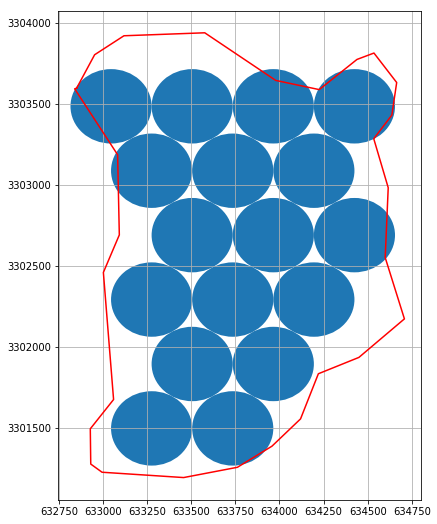

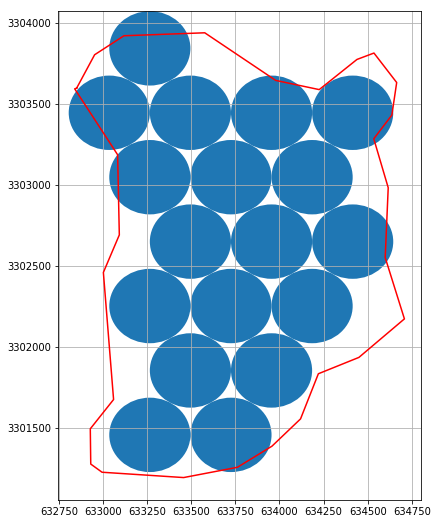

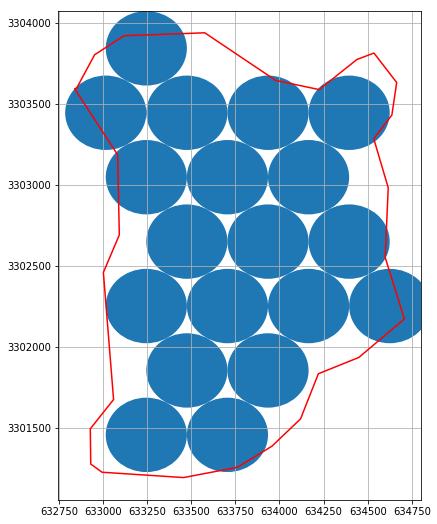

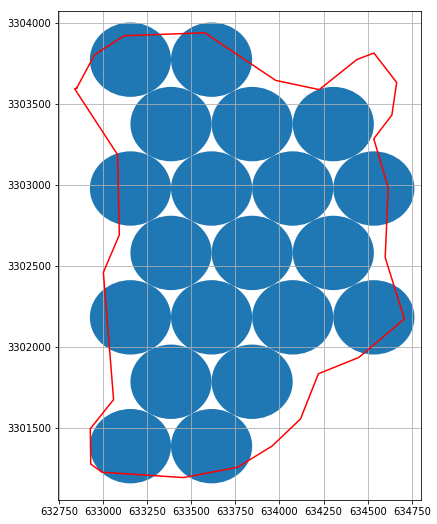

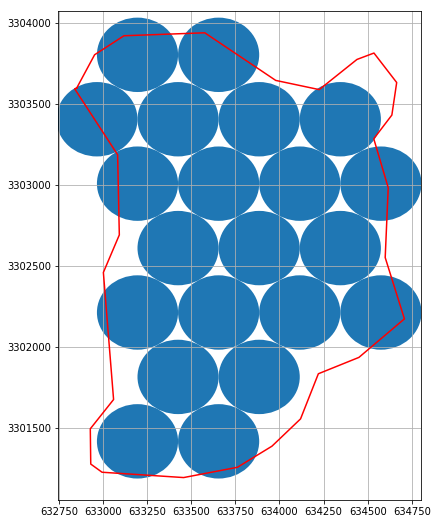

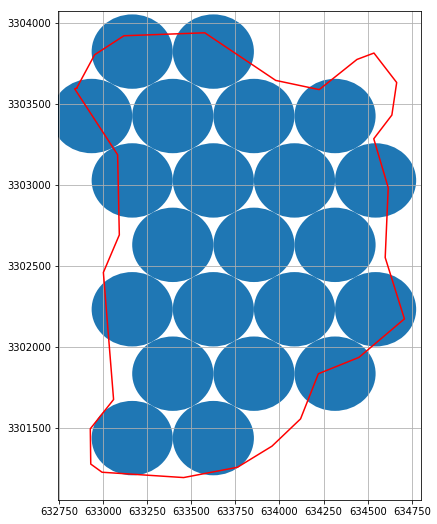

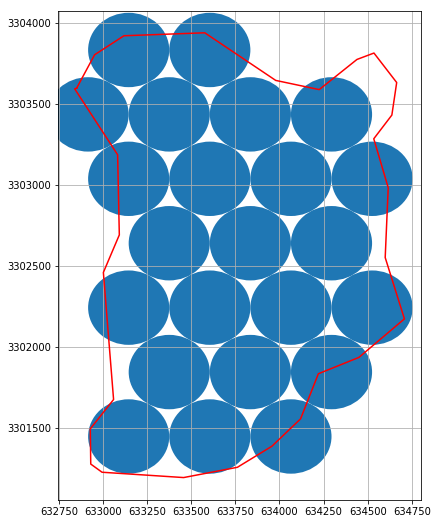

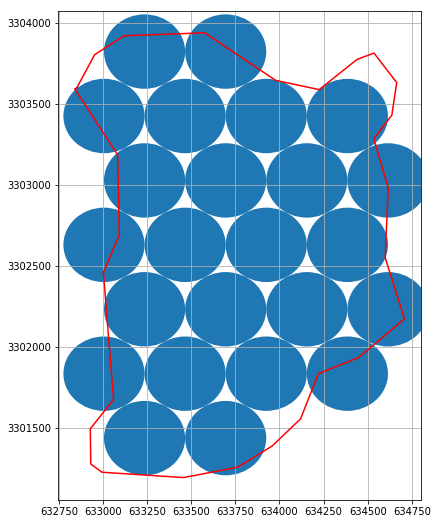

In [2]:
## Code for number of cameras from 17 - 24 
for l in range(17, 25):    
    shape = shapefile.Reader("Shapefile_Meters.shp")


    for shape in shape.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]    
        y = [i[1] for i in shape.shape.points[:]] 

    shape = shapefile.Reader("Shapefile_Meters.shp")
    def merge_two_dicts(x, y):
            z = x.copy()   # start with x's keys and values
            z.update(y)    # modifies z with y's keys and values & returns None
            return z
    shape = shapefile.Reader("Shapefile_Meters.shp")

    coord = []
    for shape in shape.shapeRecords():
        for i in shape.shape.points[:]:
            point = []
            x = i[0]
            point.append(x)
            y = i[1]     
            point.append(y)    
            coord.append(point)
    polygon = Polygon(coord)
    total_region = polygon.area
    total_camera = l
    global_coverage = 0
    final_dict = {} 
    r = 230

    for j in range(45):
        for k in range(45):
            list_center = []
            for i in range(20):
                for x in np.arange(631065,634750 + 1000,460):
                    for y in np.arange(3300000 + (230*math.sqrt(3))*i*2, 3300000  + 230*math.sqrt(3) + (230*math.sqrt(3))*i*2, 460):
                        point = []
                        point.append(x + 10*j)
                        point.append(y + 10*k)
                        list_center.append(point)
                for x in np.arange(631065 - 230, 634750 + 1000,460):
                    for y in np.arange(3300000 + 230*math.sqrt(3) +(230*math.sqrt(3))*i*2, 3300000  + 230*math.sqrt(3)*2+ (230*math.sqrt(3))*i*2, 460):
                        point = []
                        point.append(x + 10*j)
                        point.append(y + 10*k)
                        list_center.append(point)

            accumulated = 0
            d_incomplete = {}
            d_complete = {}
            for i in list_center:
                circle = Point(i[0], i[1]).buffer(230)
                temp = []
                temp.append(i[0])
                temp.append(i[1])
                rate = polygon.intersection(circle).area/circle.area
                if rate > 0 and rate < 1:
                    d_incomplete[tuple(temp)] = rate
                elif rate == 1:
                    d_complete[tuple(temp)] = rate
                accumulated += polygon.intersection(circle).area

            order_d_incom=OrderedDict(sorted(d_incomplete.items(), key=lambda t: t[1], reverse = True))

            left_camera = total_camera - len(d_complete)

            selected_d = dict(islice(order_d_incom.items(), left_camera))

            acum = sum(selected_d.values())
            circle = Point(0, 1).buffer(230)
            coverage_rate = (acum + len(d_complete)) * circle.area / total_region

            if global_coverage < coverage_rate:
                final_dict = merge_two_dicts(d_complete, selected_d)
                global_coverage = coverage_rate

    shape = shapefile.Reader("Shapefile_Meters.shp")
    fig, ax = plt.subplots(figsize=(6.5,9.0))
    for shape in shape.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]    
        y = [i[1] for i in shape.shape.points[:]] 
        plt.plot(x,y, 'r-')
    ax.grid()  
    r = 230
    for x in list(final_dict):
        ax.add_artist(plt.Circle((x[0],x[1]),r))
        print("camera location {} ".format(x))
    print("The number of camera is ", total_camera)
    print("The coverage rate is ",  global_coverage)



('The number of camera is ', 24)
('The fake radius of camera is ', 230)
('The real coverage rate is ', 0.8755894315365322)

('camera location (633465, 3303426.9734859266) ', 1.0)
('camera location (633465, 3301833.4867429635) ', 1.0)
('camera location (634155, 3302231.8584287046) ', 1.0)
('camera location (633695, 3303028.601800186) ', 1.0)
('camera location (633465, 3302630.230114445) ', 1.0)
('camera location (633925, 3301833.4867429635) ', 1.0)
('camera location (634155, 3303028.601800186) ', 1.0)
('camera location (633925, 3302630.230114445) ', 1.0)
('camera location (633695, 3302231.8584287046) ', 1.0)
('camera location (633925, 3303426.9734859266) ', 0.9994865503153685)
('camera location (633235, 3301435.1150572225) ', 0.9994505229961956)
('camera location (634385, 3302630.230114445) ', 0.992451073876745)
('camera location (633235, 3302231.8584287046) ', 0.9913234200554749)
('camera location (634385, 3303426.9734859266) ', 0.9821016567032214)
('camera location (633695, 3301435.11

('The number of camera is ', 24)
('The fake radius of camera is ', 242)
('The real coverage rate is ', 0.8143861879021943)

('camera location (634167, 3303054.094068022) ', 1.0)
('camera location (633683, 3303054.094068022) ', 1.0)
('camera location (633925, 3302634.93777259) ', 1.0)
('camera location (633441, 3302634.93777259) ', 1.0)
('camera location (633441, 3303473.2503634533) ', 1.0)
('camera location (634167, 3302215.7814771584) ', 1.0)
('camera location (633683, 3302215.7814771584) ', 1.0)
('camera location (633925, 3301796.6251817266) ', 1.0)
('camera location (633441, 3301796.6251817266) ', 1.0)
('camera location (634409, 3302634.93777259) ', 0.9509804068247462)
('camera location (633925, 3303473.2503634533) ', 0.9497335286531061)
('camera location (634409, 3303473.2503634533) ', 0.9450546170838784)
('camera location (633199, 3302215.7814771584) ', 0.9237404693499938)
('camera location (633199, 3301377.4688862953) ', 0.902778449936081)
('camera location (633683, 3301377.46888

('The number of camera is ', 24)
('The fake radius of camera is ', 258)
('The real coverage rate is ', 0.7274301750241946)

('camera location (633963, 3302624.345541764) ', 1.0)
('camera location (634221, 3303071.2146501164) ', 1.0)
('camera location (633447, 3302624.345541764) ', 1.0)
('camera location (634221, 3302177.4764334112) ', 1.0)
('camera location (633447, 3301730.6073250584) ', 1.0)
('camera location (633705, 3303071.2146501164) ', 1.0)
('camera location (633447, 3303518.083758469) ', 1.0)
('camera location (633705, 3302177.4764334112) ', 1.0)
('camera location (633963, 3301730.6073250584) ', 0.9457510444127336)
('camera location (633189, 3302177.4764334112) ', 0.8799424576257092)
('camera location (633963, 3303518.083758469) ', 0.839480901410353)
('camera location (634479, 3302624.345541764) ', 0.8085705085787595)
('camera location (634479, 3303518.083758469) ', 0.8052698258283826)
('camera location (633189, 3303071.2146501164) ', 0.7650707852971894)
('camera location (6331

/Users/peichw3/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


('The number of camera is ', 24)
('The fake radius of camera is ', 270)
('The real coverage rate is ', 0.6640253641543488)

('camera location (633845, 3301940.6148721743) ', 1.0)
('camera location (634115, 3302408.268590218) ', 1.0)
('camera location (633845, 3302875.9223082615) ', 1.0)
('camera location (633575, 3303343.576026305) ', 1.0)
('camera location (633575, 3302408.268590218) ', 1.0)
('camera location (634115, 3303343.576026305) ', 0.9986583644958351)
('camera location (633305, 3301940.6148721743) ', 0.998371764063657)
('camera location (633575, 3301472.9611541308) ', 0.9897504974856324)
('camera location (634385, 3302875.9223082615) ', 0.9620055332358735)
('camera location (633305, 3302875.9223082615) ', 0.9490488978086543)
('camera location (633305, 3303811.2297443487) ', 0.7653797348442791)
('camera location (633035, 3301472.9611541308) ', 0.64026525362929)
('camera location (633035, 3303343.576026305) ', 0.6058422242276026)
('camera location (634385, 3301940.6148721743) ',

('The number of camera is ', 24)
('The fake radius of camera is ', 286)
('The real coverage rate is ', 0.5957295733828625)

('camera location (633563, 3302351.466123859) ', 1.0)
('camera location (633849, 3301856.099592894) ', 1.0)
('camera location (633563, 3303342.199185788) ', 1.0)
('camera location (633849, 3302846.8326548235) ', 1.0)
('camera location (634135, 3302351.466123859) ', 1.0)
('camera location (634135, 3303342.199185788) ', 0.9893703885372087)
('camera location (633277, 3301856.099592894) ', 0.9503264068181558)
('camera location (633277, 3302846.8326548235) ', 0.8886740835393786)
('camera location (634421, 3302846.8326548235) ', 0.8855280737256697)
('camera location (633563, 3301360.7330619292) ', 0.7943241648393882)
('camera location (633277, 3303837.565716753) ', 0.6815664446350499)
('camera location (632991, 3303342.199185788) ', 0.5141920005987665)
('camera location (632991, 3301360.7330619292) ', 0.46784437223474096)
('camera location (632991, 3302351.466123859) ',

('The number of camera is ', 24)
('The fake radius of camera is ', 302)
('The real coverage rate is ', 0.5358487009741404)

('camera location (634073, 3303055.3967194287) ', 1.0)
('camera location (633771, 3302532.317375543) ', 1.0)
('camera location (633469, 3302009.2380316574) ', 1.0)
('camera location (633469, 3303055.3967194287) ', 1.0)
('camera location (633167, 3303578.476063315) ', 0.9800895821111351)
('camera location (634073, 3302009.2380316574) ', 0.9670783657100164)
('camera location (634375, 3302532.317375543) ', 0.9450893758266202)
('camera location (633167, 3301486.1586877718) ', 0.8622544844919211)
('camera location (633771, 3303578.476063315) ', 0.8600742792705305)
('camera location (633771, 3301486.1586877718) ', 0.8497731427182028)
('camera location (633167, 3302532.317375543) ', 0.7536247871723962)
('camera location (634375, 3303578.476063315) ', 0.7231579545531156)
('camera location (634677, 3303055.3967194287) ', 0.31374079448782927)
('camera location (634677, 3302

('The number of camera is ', 24)
('The fake radius of camera is ', 318)
('The real coverage rate is ', 0.49703821435314394)

('camera location (633699, 3302453.1686272277) ', 1.0)
('camera location (633381, 3301902.3764704205) ', 1.0)
('camera location (634017, 3303003.9607840343) ', 1.0)
('camera location (633381, 3303003.9607840343) ', 0.988690089289866)
('camera location (634335, 3302453.1686272277) ', 0.9818332516217897)
('camera location (634017, 3301902.3764704205) ', 0.9317248326174122)
('camera location (633699, 3303554.7529408415) ', 0.9303378291909659)
('camera location (634335, 3303554.7529408415) ', 0.760598338592028)
('camera location (633063, 3303554.7529408415) ', 0.7541904843931141)
('camera location (633699, 3301351.584313614) ', 0.6632600077090475)
('camera location (633063, 3302453.1686272277) ', 0.5554176868063172)
('camera location (633063, 3301351.584313614) ', 0.5364145460768842)
('camera location (634653, 3303003.9607840343) ', 0.37630136231940897)
('camera loca

('The number of camera is ', 24)
('The fake radius of camera is ', 334)
('The real coverage rate is ', 0.4603164276269718)

('camera location (633737, 3302424.0198789123) ', 1.0)
('camera location (633403, 3301845.514909184) ', 1.0)
('camera location (634071, 3303002.5248486404) ', 1.0)
('camera location (633403, 3303002.5248486404) ', 0.9933403885788329)
('camera location (634405, 3302424.0198789123) ', 0.9012988366598471)
('camera location (633737, 3303581.029818368) ', 0.8571595736108962)
('camera location (634071, 3301845.514909184) ', 0.8232666274985968)
('camera location (633069, 3303581.029818368) ', 0.7399267926330209)
('camera location (634405, 3303581.029818368) ', 0.6260064388596981)
('camera location (633069, 3302424.0198789123) ', 0.5673201004424242)
('camera location (633737, 3301267.009939456) ', 0.4752245778583918)
('camera location (633069, 3301267.009939456) ', 0.4415156324919385)
('camera location (634739, 3303002.5248486404) ', 0.22996106267687874)
('camera location

('The number of camera is ', 24)
('The fake radius of camera is ', 354)
('The real coverage rate is ', 0.3966086378157344)

('camera location (634007, 3302892.5839435174) ', 1.0)
('camera location (633653, 3302279.4379576384) ', 1.0)
('camera location (633653, 3303505.729929397) ', 0.9712735256929108)
('camera location (634361, 3302279.4379576384) ', 0.9472730187342195)
('camera location (633299, 3301666.291971759) ', 0.9356636958305178)
('camera location (633299, 3302892.5839435174) ', 0.858738601100142)
('camera location (634361, 3303505.729929397) ', 0.7362627412049584)
('camera location (634007, 3301666.291971759) ', 0.7146456300220614)
('camera location (632945, 3303505.729929397) ', 0.493309485839241)
('camera location (632945, 3302279.4379576384) ', 0.35978001277620825)
('camera location (634715, 3302892.5839435174) ', 0.29635165316651807)
('camera location (633653, 3301053.1459858795) ', 0.1815097294392381)
('camera location (633299, 3304118.8759152764) ', 0.1704337407940673)
(

('The number of camera is ', 24)
('The fake radius of camera is ', 374)
('The real coverage rate is ', 0.3700453338819341)

('camera location (633683, 3302213.3610060923) ', 1.0)
('camera location (634057, 3302861.148008123) ', 1.0)
('camera location (633309, 3301565.5740040615) ', 0.9516273853706051)
('camera location (633683, 3303508.935010154) ', 0.9365706702099121)
('camera location (633309, 3302861.148008123) ', 0.8588472700572591)
('camera location (634431, 3302213.3610060923) ', 0.7671147675430325)
('camera location (634431, 3303508.935010154) ', 0.6244626830806363)
('camera location (634057, 3301565.5740040615) ', 0.5291338293290645)
('camera location (632935, 3303508.935010154) ', 0.4679869663200716)
('camera location (632935, 3302213.3610060923) ', 0.3500857525590941)
('camera location (634805, 3302861.148008123) ', 0.1738035911115162)
('camera location (633309, 3304156.7220121846) ', 0.1349757356220495)
('camera location (633683, 3300917.7870020308) ', 0.03638907629085308)
(

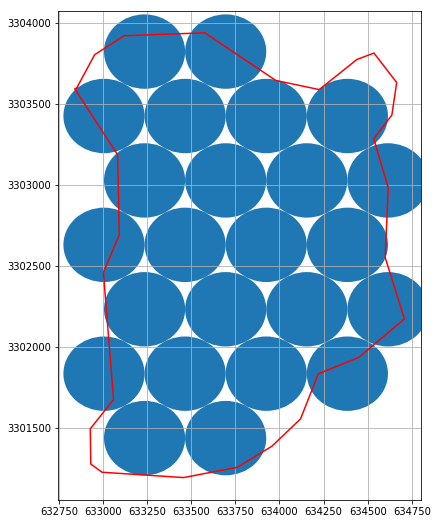

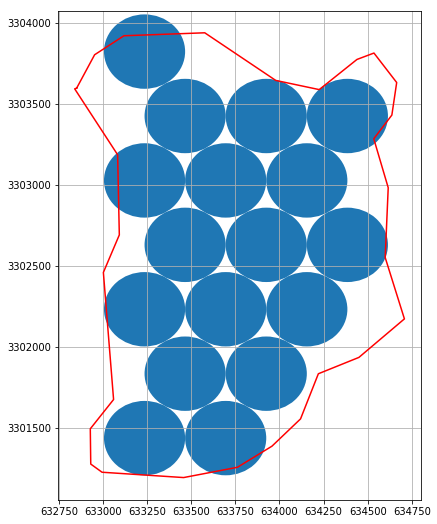

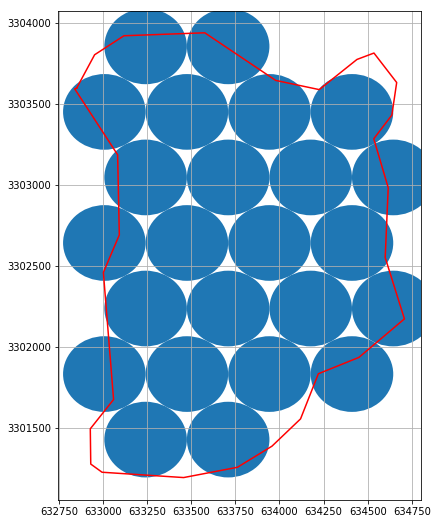

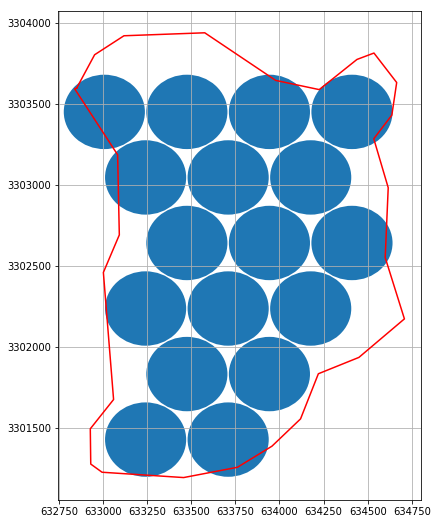

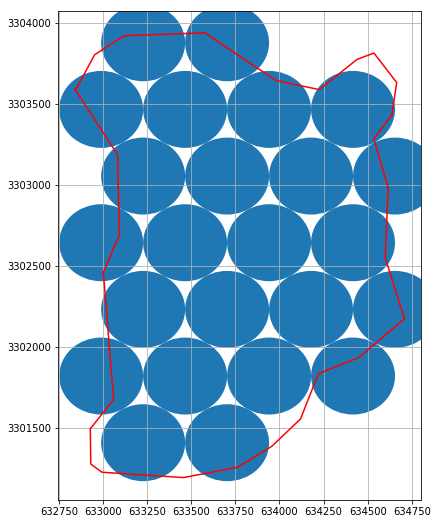

...

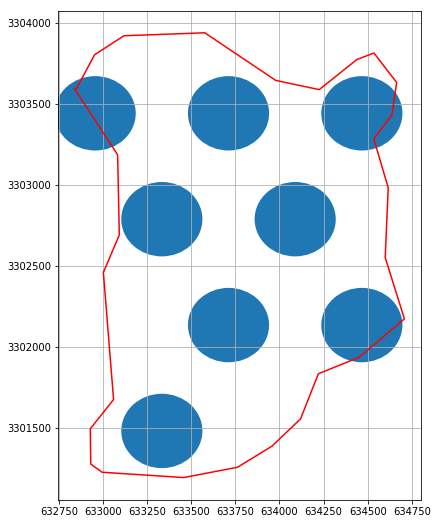

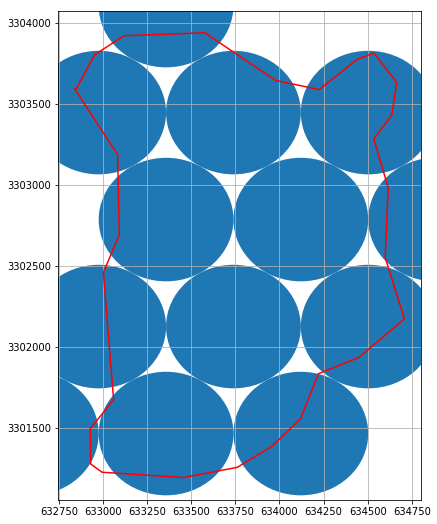

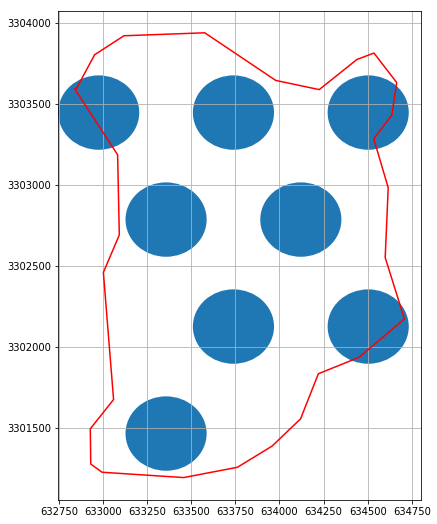

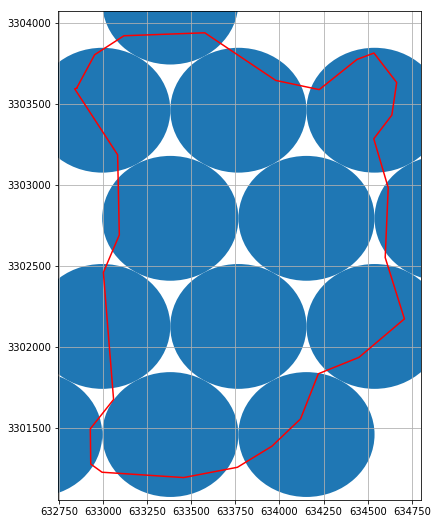

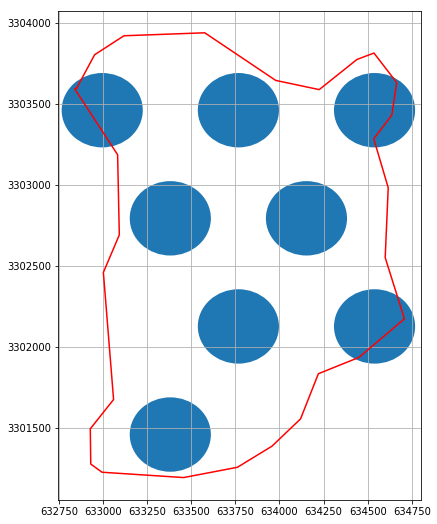

In [9]:
## Codes for number of cameras from 8 - 16 with the hexagonal circle packing algorithm
## obejective for spreading cameras

shape = shapefile.Reader("Shapefile_Meters.shp")
for shape in shape.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]    
    y = [i[1] for i in shape.shape.points[:]] 

shape = shapefile.Reader("Shapefile_Meters.shp")
def merge_two_dicts(x, y):
        z = x.copy()   # start with x's keys and values
        z.update(y)    # modifies z with y's keys and values & returns None
        return z
circle_test = Point(0, 1).buffer(230)
camera = 71 
for l in range(40):
    selected_d_1 = {}
    d_complete_1 = {}
    r = 230 + l * 4
    shape = shapefile.Reader("Shapefile_Meters.shp")
    actual_camera = int(camera/4)
    camera = camera - 1
    coord = []
    for shape in shape.shapeRecords():
        for i in shape.shape.points[:]:
            point = []
            x = i[0]
            point.append(x)
            y = i[1]     
            point.append(y)    
            coord.append(point)
    polygon = Polygon(coord)
    total_region = polygon.area
    total_camera = 24
    global_coverage = 0
    final_dict = {} 
    selected_d = {}

    for j in range(45):
        for k in range(45):
            list_center = []
            for i in range(20):
                for x in np.arange(631065,634750 + 1000, r * 2):
                    for y in np.arange(3300000 + (r*math.sqrt(3))*i*2, 3300000  + r*math.sqrt(3) + (r*math.sqrt(3))*i*2, r * 2):
                        point = []
                        point.append(x + 10*j)
                        point.append(y + 10*k)
                        list_center.append(point)
                for x in np.arange(631065 - r, 634750 + 1000,r * 2):
                    for y in np.arange(3300000 + r*math.sqrt(3) +(r*math.sqrt(3))*i*2, 3300000  + r*math.sqrt(3)*2+ (r*math.sqrt(3))*i*2, r * 2):
                        point = []
                        point.append(x + 10*j)
                        point.append(y + 10*k)
                        list_center.append(point)

            accumulated = 0
            d_incomplete = {}
            d_complete = {}
            for i in list_center:
                circle = Point(i[0], i[1]).buffer(r)
                temp = []
                temp.append(i[0])
                temp.append(i[1])
                rate = polygon.intersection(circle).area/circle.area
                if rate > 0 and rate < 1:
                    d_incomplete[tuple(temp)] = rate
                elif rate == 1:
                    d_complete[tuple(temp)] = rate
                accumulated += polygon.intersection(circle).area

            order_d_incom=OrderedDict(sorted(d_incomplete.items(), key=lambda t: t[1], reverse = True))

            left_camera = total_camera - len(d_complete)

            selected_d = dict(islice(order_d_incom.items(), left_camera))

            acum = sum(selected_d.values())
            circle = Point(0, 1).buffer(r)
            coverage_rate = (acum + len(d_complete)) * circle.area / total_region

            if global_coverage < coverage_rate:
                final_dict = merge_two_dicts(d_complete, selected_d)
                global_coverage = coverage_rate
                test = {}
                selected_d_1 = merge_two_dicts(test, selected_d)
                d_complete_1 = merge_two_dicts(test, d_complete)
                
                

    shape = shapefile.Reader("Shapefile_Meters.shp")
    fig, ax = plt.subplots(figsize=(6.5,9.0))
    for shape in shape.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]     
        y = [i[1] for i in shape.shape.points[:]] 
        plt.plot(x,y, 'r-')
    ax.grid()  
    print("The number of camera is ", total_camera)
    print(("The fake radius of camera is ", r))
    
    for key in selected_d_1:
        current_circle = Point(key[0], key[1]).buffer(230)
        rate = polygon.intersection(current_circle).area/circle_test.area
        selected_d_1[key] = rate
    acum_1 = sum(selected_d_1.values())
    real_coverage_rate = (acum_1 + len(d_complete_1)) * circle_test.area / total_region
    print("The real coverage rate is ",  real_coverage_rate)
    print("")

    final_dict = OrderedDict(sorted(final_dict.items(), key=lambda t: t[1], reverse = True))
    for x in list(final_dict):
        ax.add_artist(plt.Circle((x[0],x[1]), r))
        print("camera location {} ".format(x), final_dict.get(x))
    print("")
    
    print("The follwoing is ", actual_camera, " plot.")
    print("")
    shape = shapefile.Reader("Shapefile_Meters.shp")
    fig, ax = plt.subplots(figsize=(6.5,9.0))
    for shape in shape.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]     
        y = [i[1] for i in shape.shape.points[:]] 
        plt.plot(x,y, 'r-')
    ax.grid()
    for x in list(final_dict):
        if actual_camera > 0:
            ax.add_artist(plt.Circle((x[0],x[1]), 230))
            actual_camera = actual_camera - 1
            print("camera location {} ".format(x), final_dict.get(x))
    print("")
    
        
    

('The number of camera is ', 24)
('The fake radius of camera is ', 246)
('The real coverage rate is ', 0.7053144165061114)

('camera location (634037, 3302830) ', 1.0)
('camera location (633545, 3303322) ', 1.0)
('camera location (633545, 3301846) ', 1.0)
('camera location (634037, 3303322) ', 1.0)
('camera location (633545, 3302830) ', 1.0)
('camera location (633545, 3302338) ', 1.0)
('camera location (634037, 3302338) ', 1.0)
('camera location (634037, 3301846) ', 0.9315184875331052)
('camera location (633545, 3301354) ', 0.83877266627413)
('camera location (634529, 3302338) ', 0.8126868820818004)
('camera location (633545, 3303814) ', 0.7277989686728679)
('camera location (634529, 3302830) ', 0.7015869213730853)
('camera location (634529, 3303322) ', 0.6569865795031264)
('camera location (633053, 3301354) ', 0.6383707621062377)
('camera location (633053, 3303322) ', 0.6291513513203841)
('camera location (633053, 3302338) ', 0.5912075588577959)
('camera location (633053, 3303814) ', 

('The number of camera is ', 24)
('The fake radius of camera is ', 262)
('The real coverage rate is ', 0.6182491349931336)

('camera location (633601, 3303554) ', 1.0)
('camera location (633601, 3303030) ', 1.0)
('camera location (633601, 3302506) ', 1.0)
('camera location (634125, 3303030) ', 1.0)
('camera location (633601, 3301982) ', 1.0)
('camera location (634125, 3302506) ', 1.0)
('camera location (633601, 3301458) ', 0.9770325186991408)
('camera location (634125, 3301982) ', 0.9401758569024311)
('camera location (633077, 3303554) ', 0.8796177195710225)
('camera location (633077, 3301458) ', 0.7471174865932403)
('camera location (634125, 3303554) ', 0.7016944851472627)
('camera location (633077, 3301982) ', 0.5973208478511368)
('camera location (633077, 3302506) ', 0.5945152421903974)
('camera location (633077, 3303030) ', 0.4937878935492778)
('camera location (634649, 3302506) ', 0.4466745981915873)
('camera location (634649, 3303554) ', 0.4276189327643162)
('camera location (634

('The number of camera is ', 24)
('The fake radius of camera is ', 278)
('The real coverage rate is ', 0.5618518799649083)

('camera location (633289, 3303586) ', 1.0)
('camera location (633845, 3302474) ', 1.0)
('camera location (633845, 3303030) ', 1.0)
('camera location (633845, 3301918) ', 1.0)
('camera location (633289, 3302474) ', 0.9924244796946382)
('camera location (633289, 3301918) ', 0.9781387667381113)
('camera location (634401, 3302474) ', 0.9453876462440028)
('camera location (633289, 3303030) ', 0.9211332593791752)
('camera location (634401, 3303030) ', 0.9000791182480389)
('camera location (633289, 3301362) ', 0.8408336516995293)
('camera location (633845, 3303586) ', 0.8043968966589015)
('camera location (634401, 3303586) ', 0.7393734901454596)
('camera location (633845, 3301362) ', 0.5668387494958645)
('camera location (634401, 3301918) ', 0.48810729548148024)
('camera location (632733, 3303586) ', 0.14451838595995928)
('camera location (632733, 3301362) ', 0.07596417

/Users/guany4/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


('The number of camera is ', 24)
('The fake radius of camera is ', 286)
('The real coverage rate is ', 0.5443319749947793)

('camera location (633793, 3302518) ', 1.0)
('camera location (633793, 3303090) ', 1.0)
('camera location (633793, 3301946) ', 1.0)
('camera location (633221, 3303662) ', 0.9829898223430943)
('camera location (634365, 3302518) ', 0.97115648285617)
('camera location (634365, 3303090) ', 0.9301502425117116)
('camera location (633221, 3301946) ', 0.874599504924237)
('camera location (633221, 3302518) ', 0.8744716682101094)
('camera location (633221, 3301374) ', 0.8465366129068556)
('camera location (633221, 3303090) ', 0.8109826927650771)
('camera location (633793, 3303662) ', 0.7217949578169427)
('camera location (633793, 3301374) ', 0.6439230196455784)
('camera location (634365, 3301946) ', 0.5876057371255142)
('camera location (634365, 3303662) ', 0.5700684155395042)
('camera location (632649, 3303662) ', 0.04292999789138973)
('camera location (632649, 3301374) ',

('The number of camera is ', 24)
('The fake radius of camera is ', 306)
('The real coverage rate is ', 0.4838807350764494)

('camera location (633823, 3302448) ', 1.0)
('camera location (633823, 3301836) ', 1.0)
('camera location (633823, 3303060) ', 1.0)
('camera location (633211, 3303672) ', 0.9346290711015918)
('camera location (634435, 3302448) ', 0.8781842646023201)
('camera location (633211, 3302448) ', 0.8522408887135131)
('camera location (633211, 3301836) ', 0.8330378484804065)
('camera location (634435, 3303060) ', 0.8015542146851782)
('camera location (633211, 3303060) ', 0.771408102206047)
('camera location (633823, 3303672) ', 0.6640831054184722)
('camera location (633211, 3301224) ', 0.5190474741286655)
('camera location (634435, 3303672) ', 0.5066834150126136)
('camera location (633823, 3301224) ', 0.3302563812398406)
('camera location (634435, 3301836) ', 0.31769957569174223)
('camera location (632599, 3303672) ', 0.01602240486278648)

('The follwoing is ', 13, ' plot.'

('The number of camera is ', 24)
('The fake radius of camera is ', 326)
('The real coverage rate is ', 0.4398236971352193)

('camera location (633833, 3302106) ', 1.0)
('camera location (633833, 3302758) ', 1.0)
('camera location (633833, 3303410) ', 0.97910522965199)
('camera location (633181, 3303410) ', 0.8708286437408901)
('camera location (633181, 3301454) ', 0.8083614162492739)
('camera location (633181, 3302106) ', 0.7876326206350027)
('camera location (634485, 3302758) ', 0.7351790772804699)
('camera location (634485, 3303410) ', 0.7226826957892845)
('camera location (633833, 3301454) ', 0.7081149458731845)
('camera location (633181, 3302758) ', 0.7070285755486527)
('camera location (634485, 3302106) ', 0.644833338657126)
('camera location (633181, 3304062) ', 0.20607309799943827)
('camera location (633833, 3304062) ', 0.06322998904287945)
('camera location (634485, 3304062) ', 0.024414490423972517)

('The follwoing is ', 11, ' plot.')

('camera location (633833, 3302106) ', 1.

('The number of camera is ', 24)
('The fake radius of camera is ', 350)
('The real coverage rate is ', 0.39172192090642916)

('camera location (633915, 3302880) ', 1.0)
('camera location (633915, 3302180) ', 1.0)
('camera location (633215, 3303580) ', 0.9720946599208566)
('camera location (633215, 3301480) ', 0.8379358995379639)
('camera location (633215, 3302180) ', 0.8315798470039085)
('camera location (633215, 3302880) ', 0.734528101785431)
('camera location (633915, 3303580) ', 0.7176404411166764)
('camera location (633915, 3301480) ', 0.6295567040153319)
('camera location (634615, 3302180) ', 0.47328949610820836)
('camera location (634615, 3302880) ', 0.47128917490588595)
('camera location (634615, 3303580) ', 0.39808272499596725)
('camera location (632515, 3303580) ', 0.002105505622068321)

('The follwoing is ', 10, ' plot.')

('camera location (633915, 3302880) ', 1.0)
('camera location (633915, 3302180) ', 1.0)
('camera location (633215, 3303580) ', 0.9720946599208566)
('camera

('The number of camera is ', 24)
('The fake radius of camera is ', 378)
('The real coverage rate is ', 0.32718674480281645)

('camera location (633773, 3303024) ', 1.0)
('camera location (633773, 3302268) ', 1.0)
('camera location (633773, 3301512) ', 0.8001261802034163)
('camera location (634529, 3302268) ', 0.6378877843907845)
('camera location (634529, 3303024) ', 0.6030989165670836)
('camera location (633773, 3303780) ', 0.5191458088586565)
('camera location (633017, 3301512) ', 0.5138483615994816)
('camera location (633017, 3302268) ', 0.48457165361551874)
('camera location (633017, 3303780) ', 0.4724557728048241)
('camera location (633017, 3303024) ', 0.41507551938480974)
('camera location (634529, 3303780) ', 0.2722831517158633)

('The follwoing is ', 8, ' plot.')

('camera location (633773, 3303024) ', 1.0)
('camera location (633773, 3302268) ', 1.0)
('camera location (633773, 3301512) ', 0.8001261802034163)
('camera location (634529, 3302268) ', 0.6378877843907845)
('camera lo

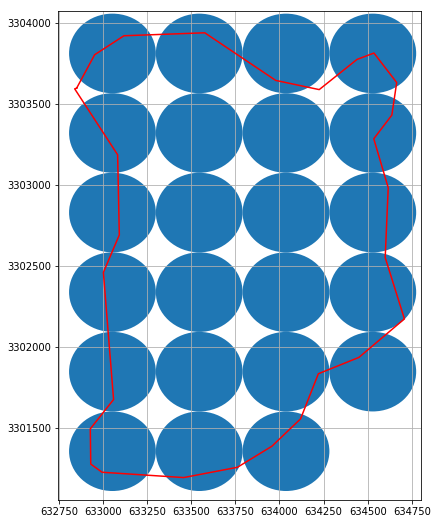

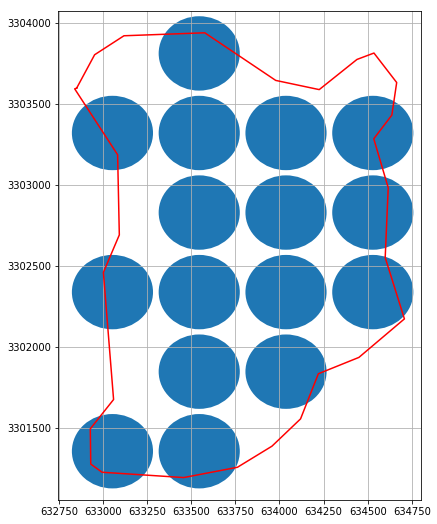

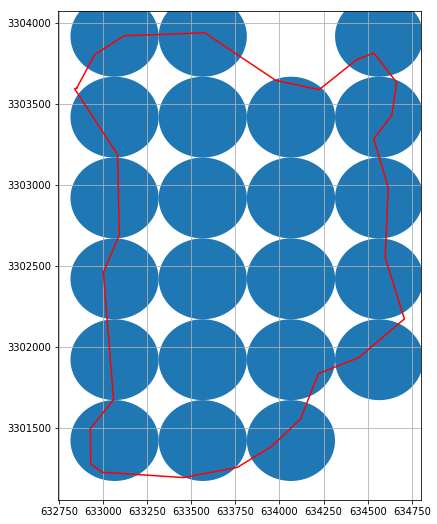

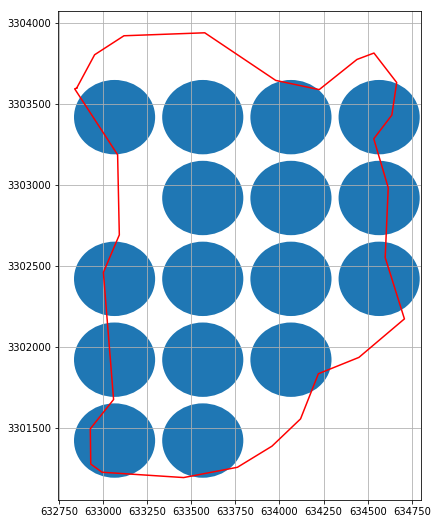

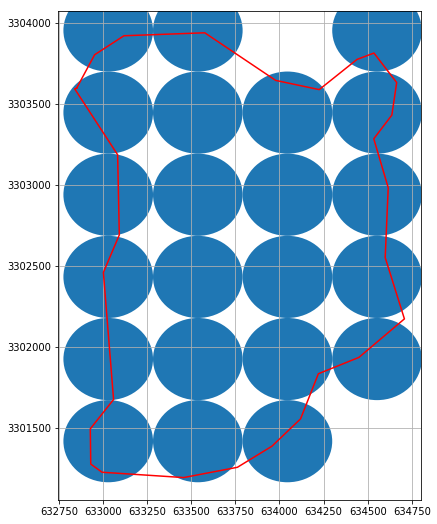

...

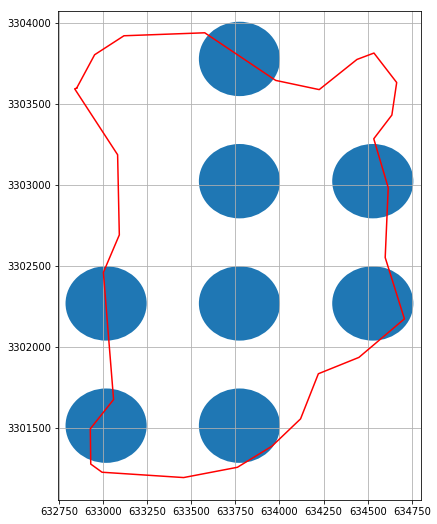

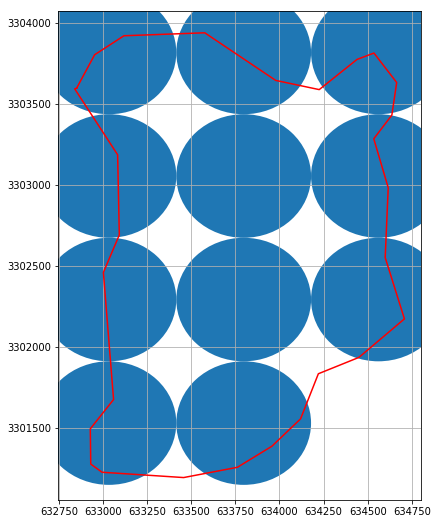

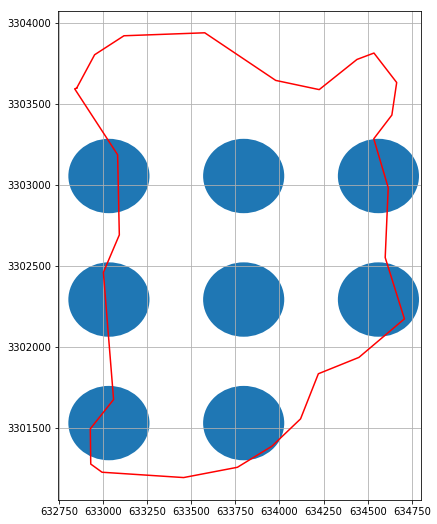

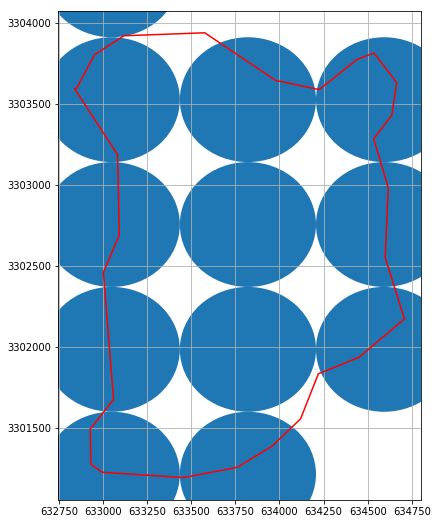

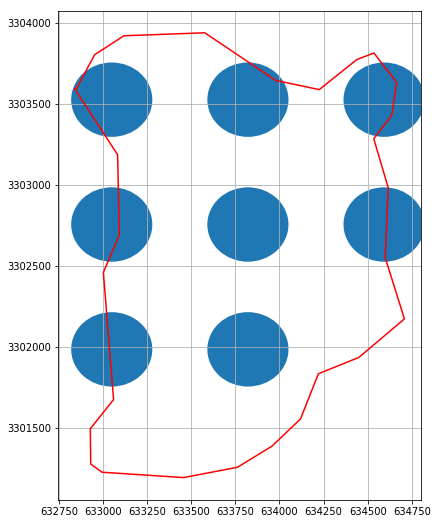

In [18]:
## Codes for number of cameras from 8 - 17 with the square circle packing algorithm
## obejective for spreading cameras

shape = shapefile.Reader("Shapefile_Meters.shp")
for shape in shape.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]    
    y = [i[1] for i in shape.shape.points[:]] 

shape = shapefile.Reader("Shapefile_Meters.shp")
def merge_two_dicts(x, y):
        z = x.copy()   # start with x's keys and values
        z.update(y)    # modifies z with y's keys and values & returns None
        return z
circle_test = Point(0, 1).buffer(230)
camera = 67 
for l in range(4,40):
    selected_d_1 = {}
    d_complete_1 = {}
    r = 230 + l * 4
    shape = shapefile.Reader("Shapefile_Meters.shp")
    actual_camera = int(camera/4)
    camera = camera - 1
    coord = []
    for shape in shape.shapeRecords():
        for i in shape.shape.points[:]:
            point = []
            x = i[0]
            point.append(x)
            y = i[1]     
            point.append(y)    
            coord.append(point)
    polygon = Polygon(coord)
    total_region = polygon.area
    total_camera = 24
    global_coverage = 0
    final_dict = {} 
    selected_d = {}

    for j in range(45):
        for k in range(45):
            list_center = []
            for x in np.arange(631065,634750 + 1000, r * 2):
                for y in np.arange(3300000, 3305000 , r * 2):
                    point = []
                    point.append(x + 10*j)
                    point.append(y + 10*k)
                    list_center.append(point)
            accumulated = 0
            d_incomplete = {}
            d_complete = {}
            for i in list_center:
                circle = Point(i[0], i[1]).buffer(r)
                temp = []
                temp.append(i[0])
                temp.append(i[1])
                rate = polygon.intersection(circle).area/circle.area
                if rate > 0 and rate < 1:
                    d_incomplete[tuple(temp)] = rate
                elif rate == 1:
                    d_complete[tuple(temp)] = rate
                accumulated += polygon.intersection(circle).area

            order_d_incom=OrderedDict(sorted(d_incomplete.items(), key=lambda t: t[1], reverse = True))

            left_camera = total_camera - len(d_complete)

            selected_d = dict(islice(order_d_incom.items(), left_camera))

            acum = sum(selected_d.values())
            circle = Point(0, 1).buffer(r)
            coverage_rate = (acum + len(d_complete)) * circle.area / total_region

            if global_coverage < coverage_rate:
                final_dict = merge_two_dicts(d_complete, selected_d)
                global_coverage = coverage_rate
                test = {}
                selected_d_1 = merge_two_dicts(test, selected_d)
                d_complete_1 = merge_two_dicts(test, d_complete)
                
                

    shape = shapefile.Reader("Shapefile_Meters.shp")
    fig, ax = plt.subplots(figsize=(6.5,9.0))
    for shape in shape.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]     
        y = [i[1] for i in shape.shape.points[:]] 
        plt.plot(x,y, 'r-')
    ax.grid()  
    print("The number of camera is ", total_camera)
    print(("The fake radius of camera is ", r))
    
    for key in selected_d_1:
        current_circle = Point(key[0], key[1]).buffer(230)
        rate = polygon.intersection(current_circle).area/circle_test.area
        selected_d_1[key] = rate
    acum_1 = sum(selected_d_1.values())
    real_coverage_rate = (acum_1 + len(d_complete_1)) * circle_test.area / total_region
    print("The real coverage rate is ",  real_coverage_rate)
    print("")

    final_dict = OrderedDict(sorted(final_dict.items(), key=lambda t: t[1], reverse = True))
    
    for x in list(final_dict):
        ax.add_artist(plt.Circle((x[0],x[1]), r))
        print("camera location {} ".format(x), final_dict.get(x))
    print("")
    
    print("The follwoing is ", actual_camera, " plot.")
    print("")
    shape = shapefile.Reader("Shapefile_Meters.shp")
    fig, ax = plt.subplots(figsize=(6.5,9.0))
    for shape in shape.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]     
        y = [i[1] for i in shape.shape.points[:]] 
        plt.plot(x,y, 'r-')
    ax.grid()
    
    for x in list(final_dict):
        if actual_camera > 0:
            ax.add_artist(plt.Circle((x[0],x[1]), 230))
            actual_camera = actual_camera - 1
            print("camera location {} ".format(x), final_dict.get(x))
    print("")
    
        
    

('The number of camera is ', 24)
('The fake radius of camera is ', 254)
('The real coverage rate is ', 0.6606652887039625)

('camera location (633537, 3303448) ', 1.0)
('camera location (634045, 3302432) ', 1.0)
('camera location (634045, 3302940) ', 1.0)
('camera location (633537, 3301924) ', 1.0)
('camera location (633537, 3302940) ', 1.0)
('camera location (633537, 3302432) ', 1.0)
('camera location (634045, 3301924) ', 0.9680103200581818)
('camera location (633537, 3301416) ', 0.9482445565530337)
('camera location (634045, 3303448) ', 0.913958626590248)
('camera location (633029, 3303448) ', 0.7122842298126042)
('camera location (634553, 3302432) ', 0.7056410924226891)
('camera location (634553, 3303448) ', 0.6467002044601619)
('camera location (633029, 3301416) ', 0.6290997162968224)
('camera location (634553, 3302940) ', 0.6205802424830293)
('camera location (633029, 3302432) ', 0.5059024396116671)
('camera location (633029, 3301924) ', 0.470042468736051)
('camera location (63353

('The number of camera is ', 24)
('The fake radius of camera is ', 274)
('The real coverage rate is ', 0.5731961216776832)

('camera location (633835, 3301924) ', 1.0)
('camera location (633835, 3302472) ', 1.0)
('camera location (633287, 3303568) ', 1.0)
('camera location (633835, 3303020) ', 1.0)
('camera location (633287, 3302472) ', 0.9943369994470423)
('camera location (633287, 3301924) ', 0.9802355909771157)
('camera location (634383, 3302472) ', 0.9700937002445071)
('camera location (634383, 3303020) ', 0.9381053026621422)
('camera location (633287, 3303020) ', 0.9218921368418141)
('camera location (633287, 3301376) ', 0.8717740252447401)
('camera location (633835, 3303568) ', 0.8456301866772286)
('camera location (634383, 3303568) ', 0.7942780320030279)
('camera location (633835, 3301376) ', 0.6088672286970833)
('camera location (634383, 3301924) ', 0.5247686353976498)
('camera location (632739, 3303568) ', 0.1498928628290793)
('camera location (633287, 3304116) ', 0.1033099128

('The number of camera is ', 24)
('The fake radius of camera is ', 294)
('The real coverage rate is ', 0.5220129514724864)

('camera location (633827, 3303100) ', 1.0)
('camera location (633827, 3302512) ', 1.0)
('camera location (633827, 3301924) ', 1.0)
('camera location (633239, 3303688) ', 0.9421575303422405)
('camera location (634415, 3302512) ', 0.9037746432214129)
('camera location (633239, 3302512) ', 0.8972014806366854)
('camera location (633239, 3301924) ', 0.8930905482702176)
('camera location (634415, 3303100) ', 0.8418477184414075)
('camera location (633239, 3303100) ', 0.8381713217772488)
('camera location (633239, 3301336) ', 0.768251984022823)
('camera location (633827, 3303688) ', 0.6361612735660771)
('camera location (633827, 3301336) ', 0.5300310573740374)
('camera location (634415, 3303688) ', 0.5003383379258158)
('camera location (634415, 3301924) ', 0.48067842527503424)
('camera location (632651, 3303688) ', 0.04629632115448773)
('camera location (632651, 3301336)

('The number of camera is ', 24)
('The fake radius of camera is ', 318)
('The real coverage rate is ', 0.4539170177808259)

('camera location (633829, 3302744) ', 1.0)
('camera location (633829, 3302108) ', 1.0)
('camera location (633829, 3303380) ', 0.9982139158409735)
('camera location (633193, 3303380) ', 0.8748201434844322)
('camera location (633193, 3301472) ', 0.8631726964138855)
('camera location (633193, 3302108) ', 0.8152590418661336)
('camera location (634465, 3302744) ', 0.7778199055795626)
('camera location (634465, 3303380) ', 0.7666179749553758)
('camera location (633829, 3301472) ', 0.7487141607754569)
('camera location (633193, 3302744) ', 0.7352461008985863)
('camera location (634465, 3302108) ', 0.688264851517241)
('camera location (633193, 3304016) ', 0.2820598377117161)
('camera location (633829, 3304016) ', 0.10895726361495624)
('camera location (634465, 3304016) ', 0.04953658131213525)

('The follwoing is ', 9, ' plot.')

('camera location (633829, 3302744) ', 1.0

('The number of camera is ', 24)
('The fake radius of camera is ', 342)
('The real coverage rate is ', 0.4166092227291084)

('camera location (633871, 3302182) ', 1.0)
('camera location (633871, 3302866) ', 1.0)
('camera location (633187, 3303550) ', 0.9436218820650379)
('camera location (633187, 3301498) ', 0.8251017676444579)
('camera location (633187, 3302182) ', 0.7942054986899088)
('camera location (633871, 3303550) ', 0.7934968094836654)
('camera location (633871, 3301498) ', 0.7145574463852761)
('camera location (633187, 3302866) ', 0.6925176492155349)
('camera location (634555, 3302866) ', 0.5847606206940268)
('camera location (634555, 3302182) ', 0.5793861805612718)
('camera location (634555, 3303550) ', 0.49314306216287757)
('camera location (633187, 3304234) ', 0.016932303476477444)
('camera location (632503, 3303550) ', 2.6863766708844173e-05)

('The follwoing is ', 8, ' plot.')

('camera location (633871, 3302182) ', 1.0)
('camera location (633871, 3302866) ', 1.0)
('camer

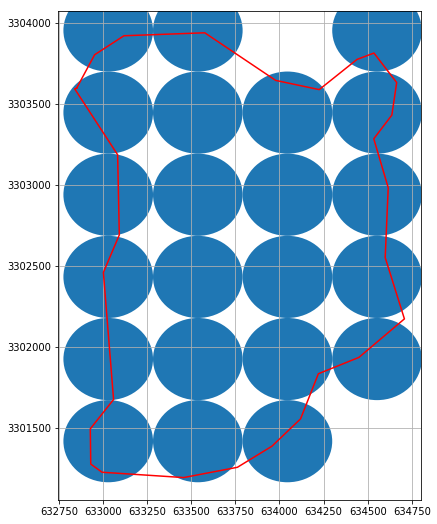

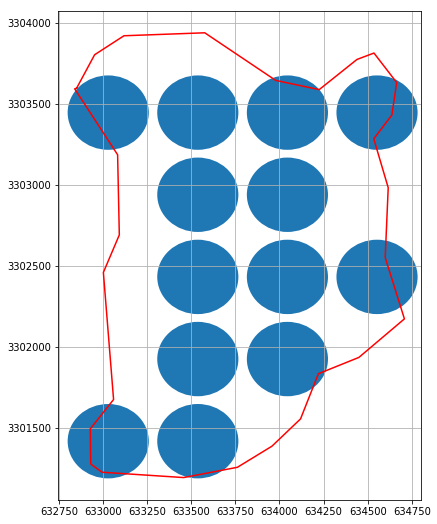

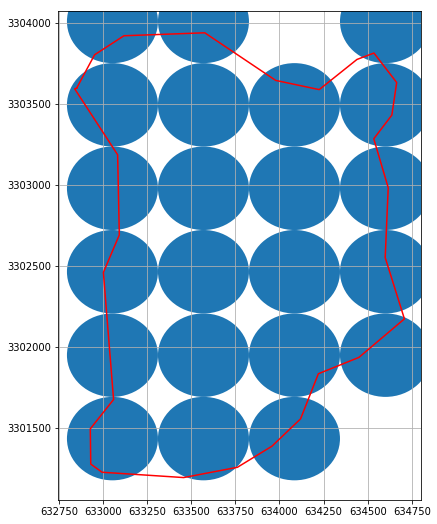

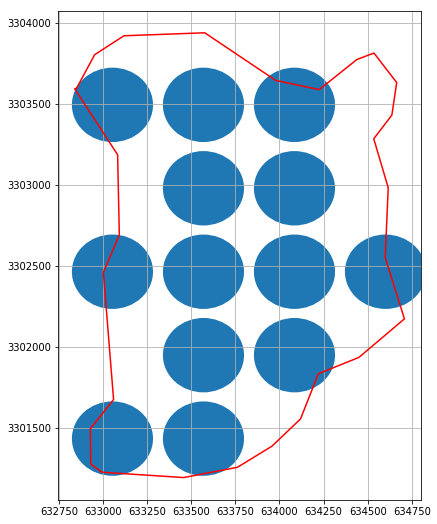

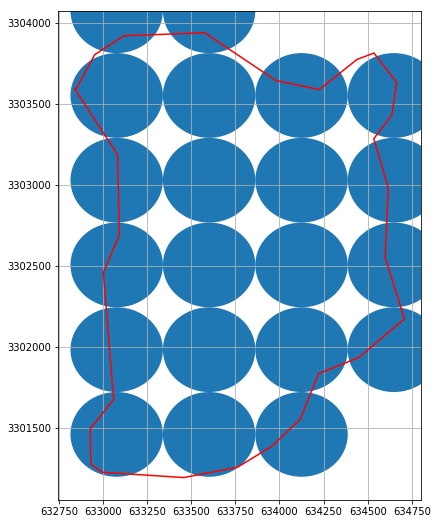

...

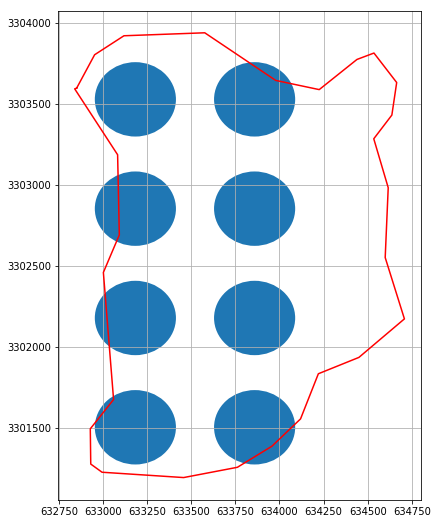

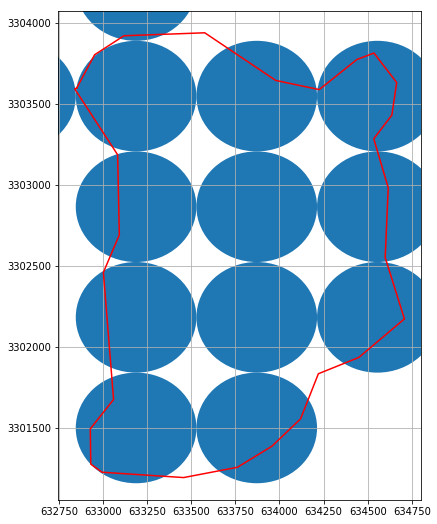

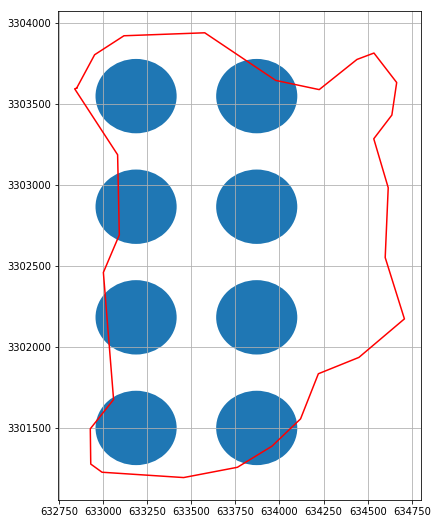

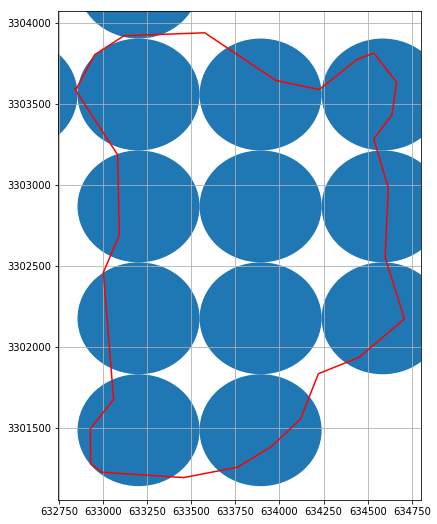

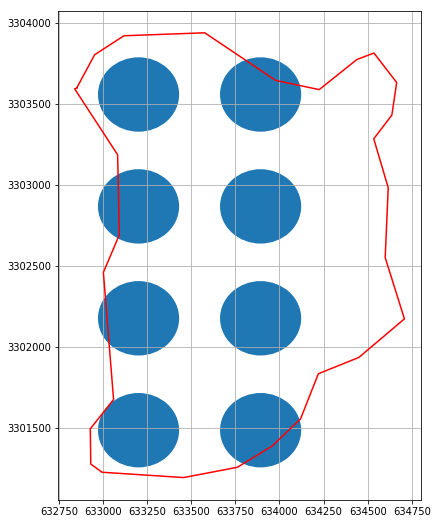

In [23]:
## Codes for number of cameras from 8 - 13 with the square circle packing algorithm
## obejective for spreading cameras

shape = shapefile.Reader("Shapefile_Meters.shp")
for shape in shape.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]    
    y = [i[1] for i in shape.shape.points[:]] 

shape = shapefile.Reader("Shapefile_Meters.shp")
def merge_two_dicts(x, y):
        z = x.copy()   # start with x's keys and values
        z.update(y)    # modifies z with y's keys and values & returns None
        return z
circle_test = Point(0, 1).buffer(230)
camera = 55 
for l in range(6,30):
    selected_d_1 = {}
    d_complete_1 = {}
    r = 230 + l * 4
    shape = shapefile.Reader("Shapefile_Meters.shp")
    actual_camera = int(camera/4)
    camera = camera - 1
    coord = []
    for shape in shape.shapeRecords():
        for i in shape.shape.points[:]:
            point = []
            x = i[0]
            point.append(x)
            y = i[1]     
            point.append(y)    
            coord.append(point)
    polygon = Polygon(coord)
    total_region = polygon.area
    total_camera = 24
    global_coverage = 0
    final_dict = {} 
    selected_d = {}

    for j in range(45):
        for k in range(45):
            list_center = []
            for x in np.arange(631065,634750 + 1000, r * 2):
                for y in np.arange(3300000, 3305000 , r * 2):
                    point = []
                    point.append(x + 10*j)
                    point.append(y + 10*k)
                    list_center.append(point)
            accumulated = 0
            d_incomplete = {}
            d_complete = {}
            for i in list_center:
                circle = Point(i[0], i[1]).buffer(r)
                temp = []
                temp.append(i[0])
                temp.append(i[1])
                rate = polygon.intersection(circle).area/circle.area
                if rate > 0 and rate < 1:
                    d_incomplete[tuple(temp)] = rate
                elif rate == 1:
                    d_complete[tuple(temp)] = rate
                accumulated += polygon.intersection(circle).area

            order_d_incom=OrderedDict(sorted(d_incomplete.items(), key=lambda t: t[1], reverse = True))

            left_camera = total_camera - len(d_complete)

            selected_d = dict(islice(order_d_incom.items(), left_camera))

            acum = sum(selected_d.values())
            circle = Point(0, 1).buffer(r)
            coverage_rate = (acum + len(d_complete)) * circle.area / total_region

            if global_coverage < coverage_rate:
                final_dict = merge_two_dicts(d_complete, selected_d)
                global_coverage = coverage_rate
                test = {}
                selected_d_1 = merge_two_dicts(test, selected_d)
                d_complete_1 = merge_two_dicts(test, d_complete)
                
                

    shape = shapefile.Reader("Shapefile_Meters.shp")
    fig, ax = plt.subplots(figsize=(6.5,9.0))
    for shape in shape.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]     
        y = [i[1] for i in shape.shape.points[:]] 
        plt.plot(x,y, 'r-')
    ax.grid()  
    print("The number of camera is ", total_camera)
    print(("The fake radius of camera is ", r))
    
    for key in selected_d_1:
        current_circle = Point(key[0], key[1]).buffer(230)
        rate = polygon.intersection(current_circle).area/circle_test.area
        selected_d_1[key] = rate
    acum_1 = sum(selected_d_1.values())
    real_coverage_rate = (acum_1 + len(d_complete_1)) * circle_test.area / total_region
    print("The real coverage rate is ",  real_coverage_rate)
    print("")

    final_dict = OrderedDict(sorted(final_dict.items(), key=lambda t: t[1], reverse = True))
    
    for x in list(final_dict):
        ax.add_artist(plt.Circle((x[0],x[1]), r))
        print("camera location {} ".format(x), final_dict.get(x))
    print("")
    
    print("The follwoing is ", actual_camera, " plot.")
    print("")
    shape = shapefile.Reader("Shapefile_Meters.shp")
    fig, ax = plt.subplots(figsize=(6.5,9.0))
    for shape in shape.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]     
        y = [i[1] for i in shape.shape.points[:]] 
        plt.plot(x,y, 'r-')
    ax.grid()
    
    for x in list(final_dict):
        if actual_camera > 0:
            ax.add_artist(plt.Circle((x[0],x[1]), 230))
            actual_camera = actual_camera - 1
            print("camera location {} ".format(x), final_dict.get(x))
    print("")
    
        
    

In [24]:
454

454

In [25]:
47/4

11